# Complete EDA of Titanic Dataset

 -- Authored By: Shobhit Kulshreshtha

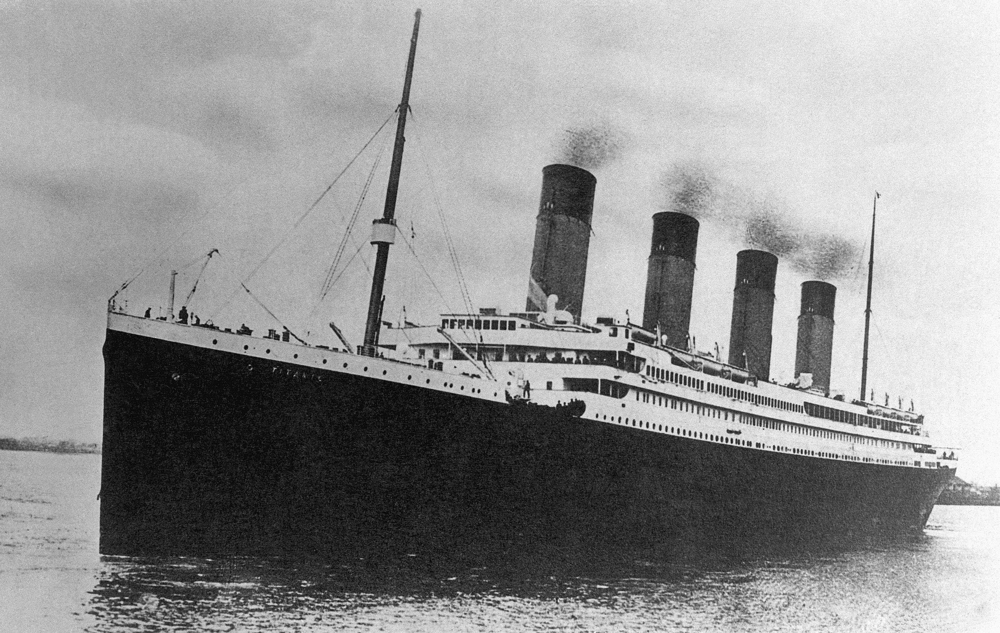

## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

## Dataset

In [2]:
titanic= sns.load_dataset("titanic")
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [3]:
type(titanic)

pandas.core.frame.DataFrame

## Understanding the Data

#### Variable Notes


<b> Survival: </b>
- Ideal variable type: Categorical
- 0= No
- 1= Yes

<b> pclass: A proxy for socio-economic status (SES) </b>
- Ideal variable type: Categorical
- 1= Upper Class
- 2= Middle Class
- 3= Lower Class

<b> sex: </b>
- Ideal variable type: Categorical
- male= male traveller
- female female traveller

<b> age: </b>
- Ideal variable type: Continuous
- Age is fractional if less than 1. 
- If the age is estimated, is it in the form of xx.5

<b> sibsp: Family Relations onboard the ship: </b>
- Ideal variable type: Categorical
- Sibling = brother, sister, stepbrother, stepsister
- Spouse = husband, wife (mistresses and fiancés were ignored)
- The integer number indicates group size of these family relations on board the ship including brother/ sister/ stepbrother/ stepsister/ husband and wife

<b> parch: Second type of family relations on board the ship: </b>
- Ideal variable type: Categorical
- Parent = mother, father
- Child = daughter, son, stepdaughter, stepson
- Some children travelled only with a nanny, therefore parch=0 for them
- The integer number indicates group size of these family relations on board the ship mother/ father/ daughter/ son/ stepdaughter/ stepson

<b> fare: Shows the amount that was paid by the individual to purchase the tickets </b>
- Ideal variable type: Continuous

<b> embarked, embark_town: Shows the port name of passenger arrival: </b>
- Ideal variable type: Both variables are categorical variables
- embark_town: shows the name of the town
- embarked: shows port code of the town

<b> class: shows cabin class of the passenger: </b>
- Ideal variable type: Categorical
- first: first class cabin
- second: second class cabin
- third: third class cabin

<b> who: shows the type of passenger: </b>
- Ideal variable type: Categorical
- man: male aged 18 or above
- woman: female aged 18 or above
- child: males and females below 18 years of age

<b> adult_male: shows whether the male is adult or not: </b>
- Ideal variable type: Boolean
- This column seems to be a repetation of column "who" and hence may be redundant. No such record exists in the dataset that is "male" in sex column and "False" in adult_male column.

<b> deck: shows the deck category of passenger </b>
- Ideal variable type: Categorical
- Has values from A to G.

<b> alive: </b>
- Ideal variable type: Categorical
- Has either "yes" or "no" as values. It seems to be a repetation of "survived" column

<b> alone: </b>
- Ideal variable type: Boolean
- Whether the passenger travelled alone or not.

In [4]:
titanic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    object  
 3   age          714 non-null    float64 
 4   sibsp        891 non-null    int64   
 5   parch        891 non-null    int64   
 6   fare         891 non-null    float64 
 7   embarked     889 non-null    object  
 8   class        891 non-null    category
 9   who          891 non-null    object  
 10  adult_male   891 non-null    bool    
 11  deck         203 non-null    category
 12  embark_town  889 non-null    object  
 13  alive        891 non-null    object  
 14  alone        891 non-null    bool    
dtypes: bool(2), category(2), float64(2), int64(4), object(5)
memory usage: 80.6+ KB


<b> Observations: </b>

- Missing values observed in age, embarked, deck, embark_town
- Total file size is <b>80.6 KB</b>

In [5]:
# According to above data, column "adult_male" seems to be a redundant colmn with the same information information 
#available from "who" column too. Reconfirming this information:

titanic[(titanic["who"]== "man") & (titanic["adult_male"]== False)]

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone


In [6]:
# Hence, dropping the column "adult_male":

titanic.drop(labels= ["adult_male"], axis= 1, inplace= True)

In [7]:
# Column "alive" seems to be same as column "survived". Reconfirming this fact:

titanic[(titanic["alive"]== "yes") & (titanic["survived"]== 0)]

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,deck,embark_town,alive,alone


In [8]:
# Thus, we dont have any value that shows "alive status" as yes and survived status as 0 thusproving its a duplicate column
# Hence, dropping "alive" column:

titanic.drop(labels= "alive", axis= 1, inplace= True)

In [9]:
# "embarked" and "embark_town" are duplicate columns with same information. Dropping the "embarked" column:

titanic.drop(labels= ["embarked"], axis= 1, inplace= True)

In [10]:
# Analysing the data in "class" and "pclass":

In [11]:
titanic["pclass"].value_counts()

3    491
1    216
2    184
Name: pclass, dtype: int64

In [12]:
titanic["class"].value_counts()

Third     491
First     216
Second    184
Name: class, dtype: int64

In [13]:
titanic.isnull().sum()

survived         0
pclass           0
sex              0
age            177
sibsp            0
parch            0
fare             0
class            0
who              0
deck           688
embark_town      2
alone            0
dtype: int64

<b> Observations: </b>

> Null values in abundance for age and deck

> Couple of missing values in "embark_town"

In [14]:
titanic.isnull().mean()

survived       0.000000
pclass         0.000000
sex            0.000000
age            0.198653
sibsp          0.000000
parch          0.000000
fare           0.000000
class          0.000000
who            0.000000
deck           0.772166
embark_town    0.002245
alone          0.000000
dtype: float64

<b> Observations: </b>

> Close to 20% null values in age

> 77% + null values in deck

> 0.2% null values in embark_town

### Addressing Missing data: AGE (20% missing values) - Imputing the value

In [15]:
# Median and Mode values of age are found to be equal

print("Number of entries where age is equal to median age:", len(titanic[titanic["age"]== titanic["age"].median()]))

Number of entries where age is equal to median age: 25


In [16]:
# Hence, imputing the isnull values in age column with median age:

titanic["age"].fillna(titanic["age"].median(), inplace= True)

### Addressing Missing data: EMBARK_TOWN (0.2% missing values) - Frequent Category Imputation

In [17]:
print("The most frequently occuring value of embark_town is", titanic["embark_town"].mode()[0], "which occurs", 
      titanic["embark_town"].value_counts().sort_values(ascending= False)[0], "times.")
print("Hence, replacing null values in embark_town with", titanic["embark_town"].mode()[0],".")

The most frequently occuring value of embark_town is Southampton which occurs 644 times.
Hence, replacing null values in embark_town with Southampton .


In [18]:
titanic["embark_town"].fillna(titanic["embark_town"].mode()[0], inplace= True)

### Addressing Missing data: DECK (77% missing values) - Dropping the column

In [19]:
# Since the missing values percentage is extremely high, researcher has decided to drop the entire column

In [20]:
titanic.drop(labels= ["deck"], axis= 1, inplace= True)

In [21]:
titanic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    object  
 3   age          891 non-null    float64 
 4   sibsp        891 non-null    int64   
 5   parch        891 non-null    int64   
 6   fare         891 non-null    float64 
 7   class        891 non-null    category
 8   who          891 non-null    object  
 9   embark_town  891 non-null    object  
 10  alone        891 non-null    bool    
dtypes: bool(1), category(1), float64(2), int64(4), object(3)
memory usage: 64.6+ KB


<b> Observations: </b>
- Number of columns have been reduced from existing 15 to 9
- Memory usage has been reduced from 80 KB to 63 KB (21% reduction in memory space usage)

In [22]:
# Following data is now ready for analysis:

titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,class,who,embark_town,alone
0,0,3,male,22.0,1,0,7.2500,Third,man,Southampton,False
1,1,1,female,38.0,1,0,71.2833,First,woman,Cherbourg,False
2,1,3,female,26.0,0,0,7.9250,Third,woman,Southampton,True
3,1,1,female,35.0,1,0,53.1000,First,woman,Southampton,False
4,0,3,male,35.0,0,0,8.0500,Third,man,Southampton,True


## Big Picture of Data:

In [23]:
titanic.describe()

,survived,pclass,age,sibsp,parch,fare
count,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000
mean,0.383838,2.308642,29.361582,0.523008,0.381594,32.204208
std,0.486592,0.836071,13.019697,1.102743,0.806057,49.693429
min,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,22.000000,0.000000,0.000000,7.910400
50%,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,1.000000,3.000000,35.000000,1.000000,0.000000,31.000000
max,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


## Final Dataset

In [24]:
titanic.head(5)

,survived,pclass,sex,age,sibsp,parch,fare,class,who,embark_town,alone
0,0,3,male,22.0,1,0,7.2500,Third,man,Southampton,False
1,1,1,female,38.0,1,0,71.2833,First,woman,Cherbourg,False
2,1,3,female,26.0,0,0,7.9250,Third,woman,Southampton,True
3,1,1,female,35.0,1,0,53.1000,First,woman,Southampton,False
4,0,3,male,35.0,0,0,8.0500,Third,man,Southampton,True


In [25]:
sns.set_style("whitegrid")

## The Big Picture - Passenger Highlights

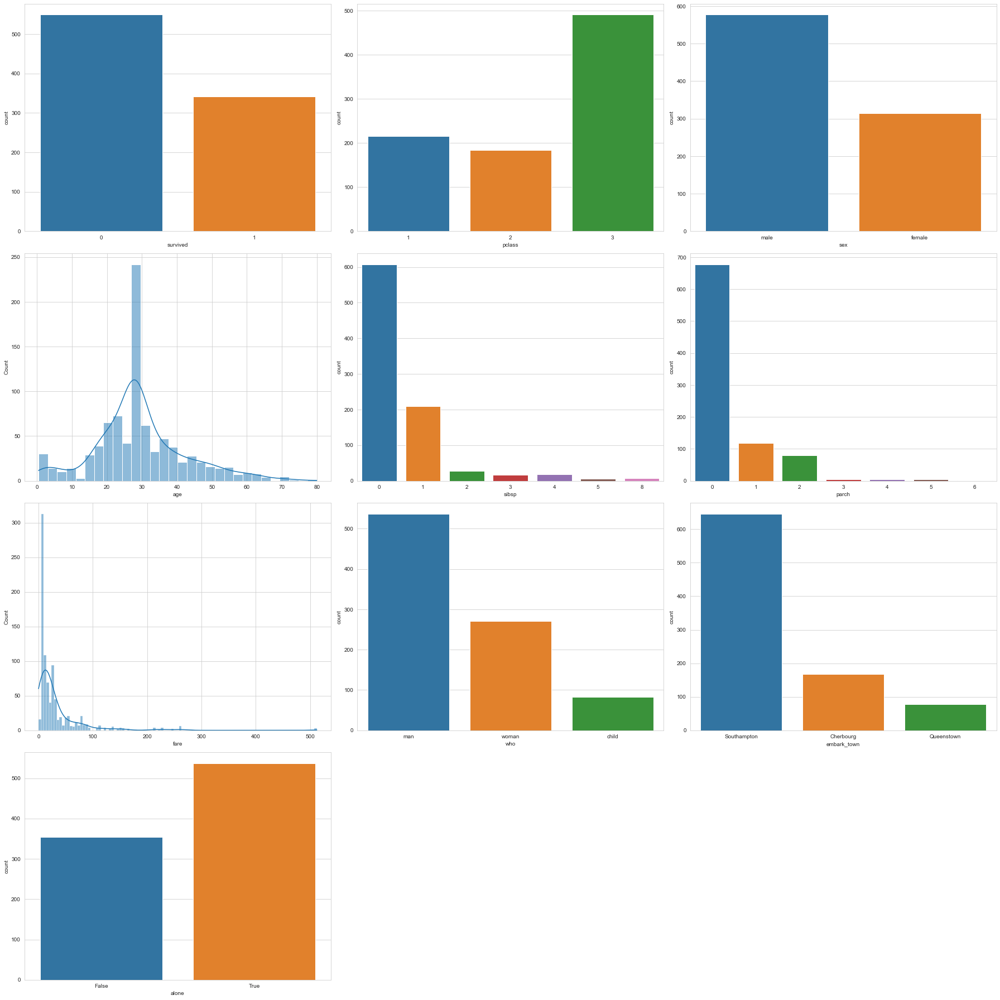

In [26]:
fig, ax= plt.subplots(nrows= 4, ncols= 3, figsize= (25, 25))
fig.delaxes(ax[3,1])
fig.delaxes(ax[3,2])

ax1= sns.countplot(x= "survived", data= titanic, ax= ax[0][0])
# ax1.set(xlabel= "ABC")
sns.countplot(x= "pclass", data= titanic, ax= ax[0][1])
sns.countplot(x= "sex", data= titanic, ax= ax[0][2])
sns.histplot(x= "age", data= titanic, kde= True, ax= ax[1][0])
sns.countplot(x= "sibsp", data= titanic, ax= ax[1][1])
sns.countplot(x= "parch", data= titanic, ax= ax[1][2])
sns.histplot(x= "fare", data= titanic, ax= ax[2][0], kde= True)
sns.countplot(x= "who", data= titanic, ax= ax[2][1])
sns.countplot(x= "embark_town", data= titanic, ax= ax[2][2])
sns.countplot(x= "alone", data= titanic, ax= ax[3][0])

plt.tight_layout()
plt.show()

<b> Observations: </b>

- Survival rate much lesser then deceased rate
- Number of passengers in class 3 > class 1 > class 2
- Male passengers were almost double the female passengers.
- Maximum people were 28-29 years old.
- The larger the groupsize of sibling and spouse, the lesser the number of such people
- The larger the groupsize of parents and children, the lesser the number of such people
- Most of the fares were below 50 USD.
- Number of men > women > children
- Maximum people embarked from Southampton followed by Cherbourg followined by Queenstown
- 500+ people were travelling alone against around 360 people who were travelling in the group.

In [27]:
titanic.describe()

,survived,pclass,age,sibsp,parch,fare
count,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000
mean,0.383838,2.308642,29.361582,0.523008,0.381594,32.204208
std,0.486592,0.836071,13.019697,1.102743,0.806057,49.693429
min,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,22.000000,0.000000,0.000000,7.910400
50%,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,1.000000,3.000000,35.000000,1.000000,0.000000,31.000000
max,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


## Demographic Study

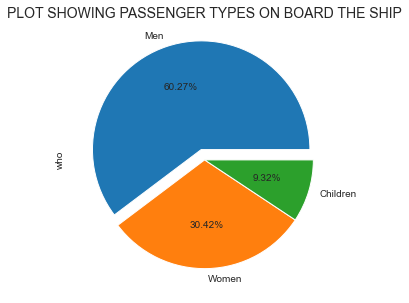

In [28]:
titanic["who"].value_counts().plot.pie(autopct= "%1.2f%%", figsize= (5,5), labels= ["Men", "Women", "Children"], explode= [0.1, 0, 0])
plt.title("Plot Showing passenger types on board the ship".upper(), fontsize= 14)
plt.show()

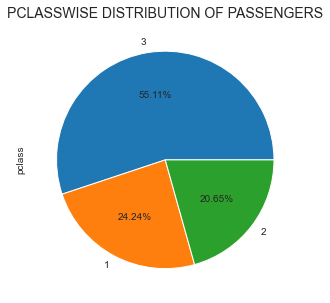

In [29]:
titanic["pclass"].value_counts().plot.pie(autopct= "%1.2f%%", figsize= (5,5))
plt.title("Pclasswise distribution of passengers".upper(), fontsize= 14)
plt.show()

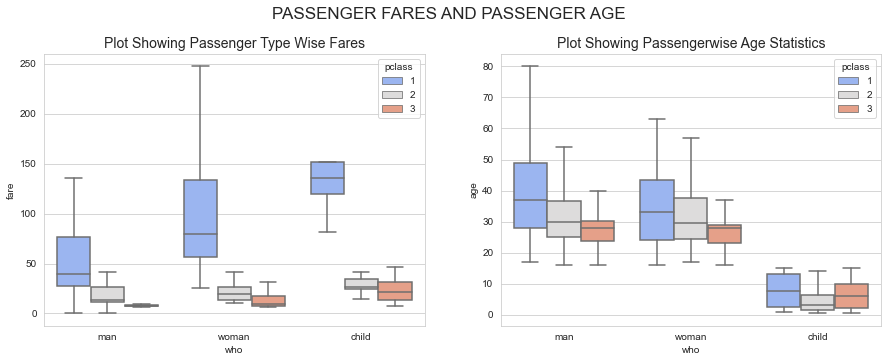

In [30]:
fig, ax= plt.subplots(nrows= 1, ncols= 2, figsize= (15, 5))
fig.suptitle("passenger fares and passenger age".upper(), fontsize= 17, y= 1.01)

ax0= sns.boxplot(x= "who", y= "fare", data= titanic, palette= "coolwarm", ax= ax[0], hue= "pclass", showfliers= False)
ax0.set_title("plot showing passenger type wise fares".title(), fontsize= 14)

ax1= sns.boxplot(x= "who", y= "age", data= titanic, palette= "coolwarm", ax= ax[1], hue= "pclass", showfliers= False)
ax1.set_title("plot showing passengerwise age statistics".title(), fontsize= 14)

plt.show()

## Survival Rates

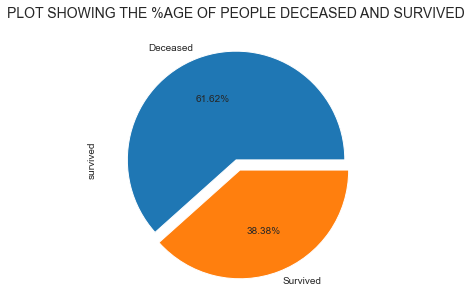

In [31]:
titanic["survived"].value_counts().plot.pie(autopct= "%1.2f%%", figsize= (5,5), labels= ["Deceased", "Survived"], explode= [0, 0.1])
plt.title("Plot Showing the %age of People Deceased and Survived".upper(), fontsize= 14)
plt.show()

<b> Observations: </b>

> 61.6% of the population lost their lives and 38.4% survived

## Survival Story

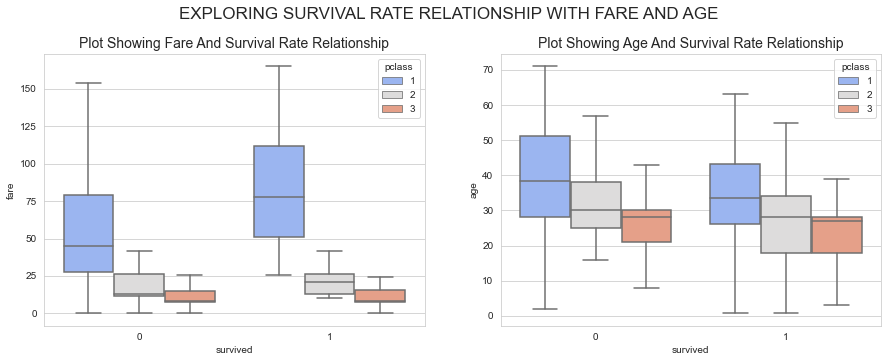

In [32]:
#######
fig, ax= plt.subplots(nrows= 1, ncols= 2, figsize= (15, 5))
fig.suptitle("Exploring survival rate relationship with fare and age".upper(), fontsize= 17, y= 1.01)

ax0= sns.boxplot(x= "survived", y= "fare", data= titanic, palette= "coolwarm", ax= ax[0], hue= "pclass", showfliers= False)
ax0.set_title("plot showing fare and survival rate relationship".title(), fontsize= 14)

ax1= sns.boxplot(x= "survived", y= "age", data= titanic, palette= "coolwarm", ax= ax[1], hue= "pclass", showfliers= False)
ax1.set_title("plot showing age and survival rate relationship".title(), fontsize= 14)

plt.show()

<b> Observations: </b>

> People paying higher fares seem to have been given preference while evacuating the ship (In pclass 1 and 2). Data seems to suggest the mean, median, std etc are similar for pclass = 3. These seems to a strong correlation of survival probability with higher fares.

> People in lower age groups have shown higher survivability.

## Survival Rates Based on Passenger Types

### Actual Survival Statistics Based on Passenger Type

In [33]:
pass_type= titanic["who"].unique()

for person in pass_type:
    print("Total", person.title(), "boarded:", len(titanic[titanic["who"]== person])," || ",
        person.title(), "survived:", len(titanic[(titanic["who"]== person) & (titanic["survived"]== 1)]), " || "
         , "Survival Percentage:", (round((len(titanic[(titanic["who"]== person) & (titanic["survived"]== 1)]))/ len(titanic[titanic["who"]== person])*100)), "%")

Total Man boarded: 537  ||  Man survived: 88  ||  Survival Percentage: 16 %
Total Woman boarded: 271  ||  Woman survived: 205  ||  Survival Percentage: 76 %
Total Child boarded: 83  ||  Child survived: 49  ||  Survival Percentage: 59 %


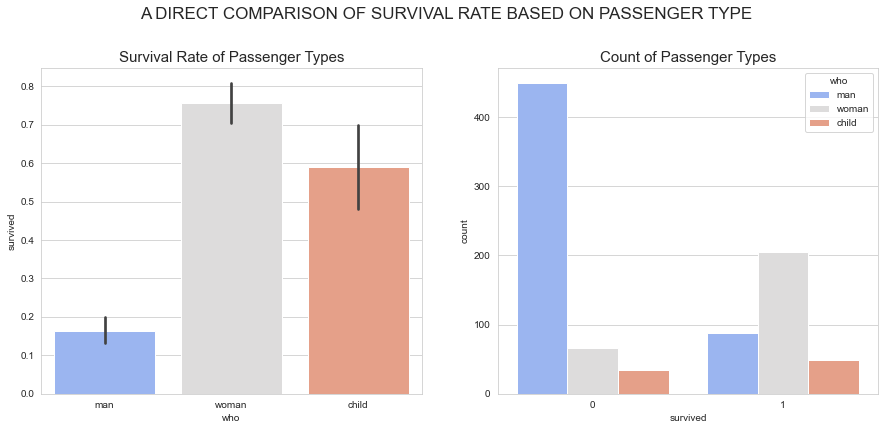

In [34]:
fig, ax= plt.subplots(nrows= 1, ncols= 2, figsize= (15, 6))
fig.suptitle("A Direct Comparison of Survival Rate Based on PAssenger Type".upper(), fontsize= 17, y= 1.02)

ax1= sns.barplot(x= "who", y= "survived", data= titanic, palette= "coolwarm", ax=ax[0])
ax1.set_title("Survival Rate of Passenger Types", fontsize= 15)

ax2= sns.countplot(x= "survived", data= titanic, palette= "coolwarm", hue= "who", ax= ax[1])
ax2.set_title("Count of Passenger Types", fontsize= 15)

plt.show()

<b> Observations on Passenger Type Survival Rates: </b>

> WOMEN:

        -- Women had highest survivability rate at 75%. But the base of women on board was much less then men. 
        
        -- 200 women seem to have survived and 70 lost their lives

> CHILDREN:

        -- Least number of passenger type were children
        
        -- Survival rate among children was 59%. But the number of children on board was very low 
        
        -- Close to 35 lost their lives.


> MEN:

        -- Men had the worst survivability rate of 17%.
        
        -- Close to 80 men survived but almost 460 could not make it alive out of tragedy.

## Overall Survival Rate of People Travelling Alone

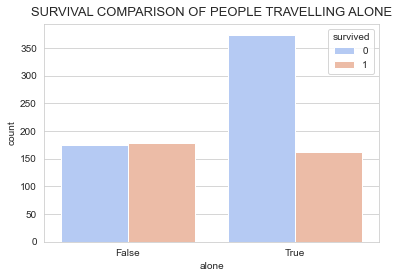

In [35]:
sns.countplot(x= "alone", data= titanic, palette= "coolwarm", hue= "survived")
plt.title("survival comparison of people travelling alone".upper(), fontsize= 13, y= 1.01)

plt.show()

<b> Observations: </b>

- People who were NOT travelling alone had 50% survival rate
- Whereas those who traveled alone, had just 30% survival rate

In [36]:
titanic.head(1)

,survived,pclass,sex,age,sibsp,parch,fare,class,who,embark_town,alone
0,0,3,male,22.0,1,0,7.25,Third,man,Southampton,False


### Further Analysis of People Travelling Alone

In [37]:
alone_survived= titanic[(titanic["alone"]== True) & (titanic["survived"]== 1)]
alone_deceased= titanic[(titanic["alone"]== True) & (titanic["survived"]== 0)]

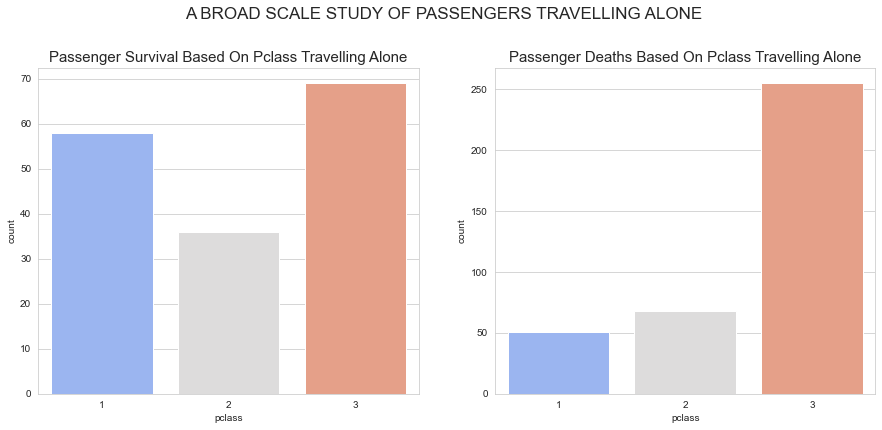

In [38]:
fig, ax= plt.subplots(nrows= 1, ncols= 2, figsize= (15, 6))
fig.suptitle("a broad scale study of passengers travelling alone".upper(), fontsize= 17, y= 1.02)

ax1= sns.countplot(x= "pclass", data= alone_survived, palette= "coolwarm", ax=ax[0])
ax1.set_title("passenger survival based on pclass travelling alone".title(), fontsize= 15)

ax2= sns.countplot(x= "pclass", data= alone_deceased, palette= "coolwarm", ax= ax[1])
ax2.set_title("passenger deaths based on pclass travelling alone".title(), fontsize= 15)

plt.show()

<b> Observations: </b>
    
    - Over 250 passengers travelling alone were lost in PClass3 and only close to 70 could survive.
    - In PClass2, 60 passengers travlling alone lost their lives against 35 who survived.
    - In PClass1, close to 60 solo travellers survived whereas 50 lost tehir lives.
- Hence, for solo travellers, the best chance of survival was to travel in PClass1 where chances of survival for such people were almost 50%.

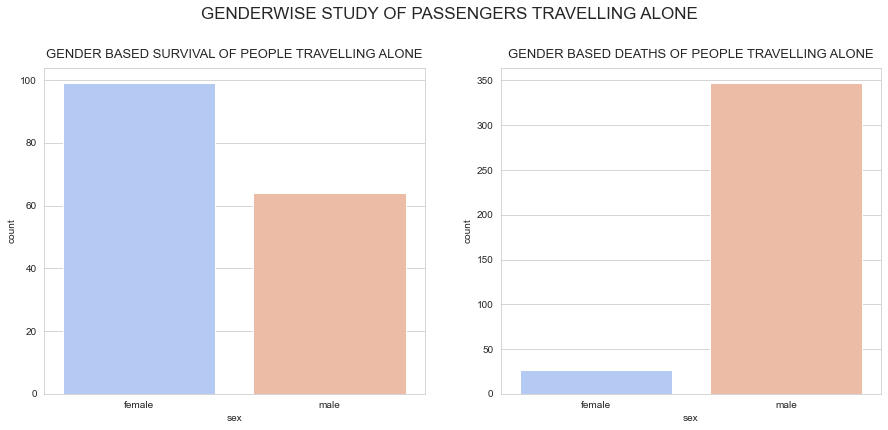

In [39]:
fig, ax= plt.subplots(nrows= 1, ncols= 2, figsize= (15, 6))
fig.suptitle("genderwise study of passengers travelling alone".upper(), fontsize= 17, y= 1.02)

ax0= sns.countplot(x= "sex", data= alone_survived, palette= "coolwarm", ax= ax[0], order= ["female", "male"])
ax0.set_title("gender based survival of people travelling alone".upper(), fontsize= 13, y= 1.01)

ax1= sns.countplot(x= "sex", data= alone_deceased, palette= "coolwarm", ax= ax[1], order= ["female", "male"])
ax1.set_title("gender based deaths of people travelling alone".upper(), fontsize= 13, y= 1.01)

plt.show()

<b> Observations: </b>

- Close to 100 solo female travellers were saved and 25 were lost
- Close to 55 solo traveller males were saved whereas close to 350 lost their lives

### Overall Survival Rate for People Travelling with Siblings and Spouce (SIBSP)

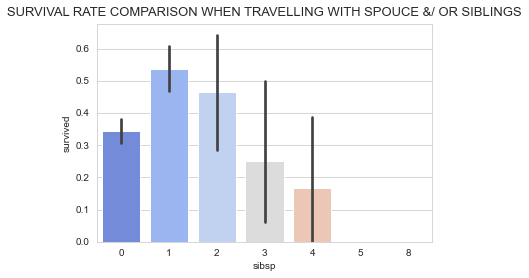

In [40]:
sns.barplot(x= "sibsp", y= "survived", data= titanic, palette= "coolwarm")
plt.title("survival rate comparison when travelling with spouce &/ or siblings".upper(), fontsize= 13, y= 1.01)
plt.show()

<b>Observations:</b>
    
    - Best chance of survival at 53% for people travelling with one co-passenger
    - The survival rates decreased as the number in the group increased.

### Overall Survival Rate for People Travelling with Parents &/ or Children (PARCH)

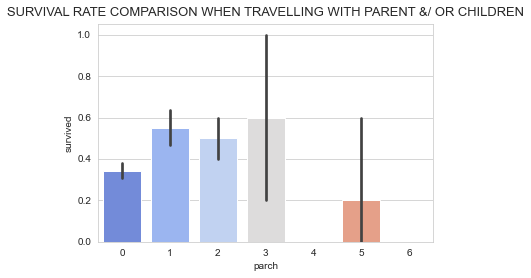

In [41]:
sns.barplot(x= "parch", y= "survived", data= titanic, palette= "coolwarm")
plt.title("survival rate comparison when travelling with parent &/ or children".upper(), fontsize= 13, y= 1.01)
plt.show()

<b> Observations: </b>

    - People travelling in group of 3 had highest chance of survival at 60%
    - Variations did not point to any specific trend

## PClass wise survival rates

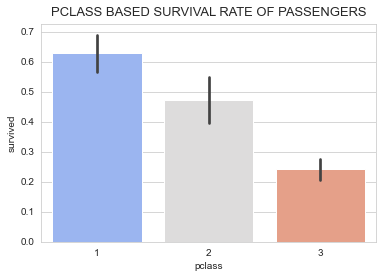

In [42]:
sns.barplot(x= "pclass", y= "survived", data= titanic, palette= "coolwarm")
plt.title("Pclass based survival rate of passengers".upper(), fontsize= 13, y= 1.01)
plt.show()

<b>Observations:</b>
    
    > The higher the Pclass, the better are the chances of survival

## Survival Rates Based on Passenger Age

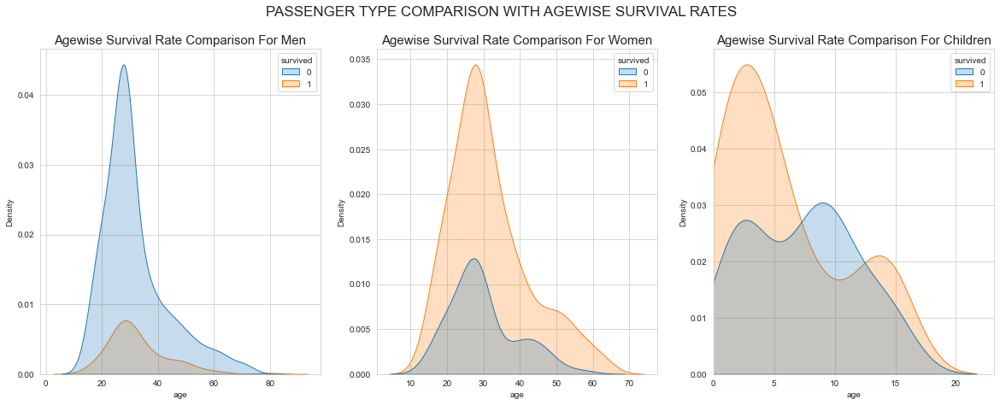

In [43]:
#####
fig, ax= plt.subplots(nrows= 1, ncols= 3, figsize= (20, 7))
fig.suptitle("Passenger Type Comparison with Agewise Survival Rates".upper(), fontsize= 17)

ax0= sns.kdeplot(titanic[titanic["who"] == "man"]["age"], hue= titanic["survived"], ax=ax[0], fill= True)
ax0.set_title("Agewise Survival rate comparison for Men".title(), fontsize= 15)

ax1= sns.kdeplot(titanic[titanic["who"] == "woman"]["age"], hue= titanic["survived"], ax=ax[1], fill= True)
ax1.set_title("Agewise Survival rate comparison for WoMen".title(), fontsize= 15)

ax2= sns.kdeplot(titanic[titanic["who"] == "child"]["age"], hue= titanic["survived"], ax=ax[2], fill= True)
ax2.set_title("Agewise Survival rate comparison for children".title(), fontsize= 15)
ax2.set_xlim(left= 0)

plt.show()

<b> AGEWISE PASSENGER SURVIVAL: </b>

> <b>Men</b>:

        -- The Kernel Density of survival rate of Men seems to be in line with that of those who deceased. 
        

> <b>Women</b>:

        -- Relatively more number of Women were saved in age range 35 - 45 as comapred to that of the ones that were saved.
        
        -- Number of women saved were more then number of women lost to the mishap.
        

> <b>Children</b>:

        -- Number of children survived were more then the ones lost
        
        -- Relatively more number of children lives were lost in age range 7.5 to 12.5.

### Creating Age Bins In DataFrame For Deeper agewise understanding

<b>Age Bins Defined: </b>
- less then 6    -> Baby
- 6 - 19         -> Adolescent
- 19 - 35        -> Youth
- 35 - 50        -> Middle Aged
- 50 - 65        -> Old
- greater then 65-> Very old

In [44]:
def AgeBins(n):
    if n <= 6:
        return "baby" 
    elif 6 < n <= 19:
        return "adolescent"
    elif 19 < n <= 35:
        return "youth"
    elif 35 < n <= 50:
        return "middle age"
    elif 50 < n <= 65:
        return "old"
    else:
        return "very old"

In [45]:
titanic["age_bins"]= titanic["age"].apply(AgeBins)

In [46]:
titanic.head(2)

,survived,pclass,sex,age,sibsp,parch,fare,class,who,embark_town,alone,age_bins
0,0,3,male,22.0,1,0,7.2500,Third,man,Southampton,False,youth
1,1,1,female,38.0,1,0,71.2833,First,woman,Cherbourg,False,middle age


### On Board Age Group Statistics and Survival Rates

In [47]:
age_range= titanic["age_bins"].unique()

for person_age in age_range:
    print(person_age.title(), "boarded:", len(titanic[titanic["age_bins"]== person_age])," || ",
         person_age.title(), "survived:", len(titanic[(titanic["age_bins"]== person_age) & (titanic["survived"]== 1)])," || "
         "Survival %age:", (round(len(titanic[(titanic["age_bins"]== person_age) & (titanic["survived"]== 1)])
                                  /len(titanic[titanic["age_bins"]== person_age])*100)),"%")

Youth boarded: 510  ||  Youth survived: 180  || Survival %age: 35 %
Middle Age boarded: 153  ||  Middle Age survived: 61  || Survival %age: 40 %
Old boarded: 56  ||  Old survived: 21  || Survival %age: 38 %
Baby boarded: 47  ||  Baby survived: 33  || Survival %age: 70 %
Adolescent boarded: 117  ||  Adolescent survived: 46  || Survival %age: 39 %
Very Old boarded: 8  ||  Very Old survived: 1  || Survival %age: 12 %


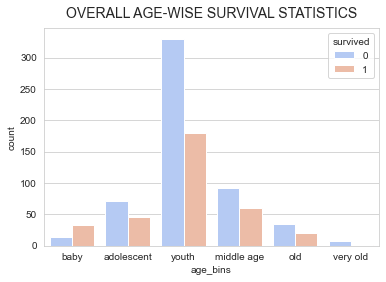

In [48]:
# Overall Agewise survival statistics:
plt.title("overall age-wise survival statistics".upper(), fontsize= 14, y= 1.02)
sns.countplot(x= "age_bins", hue= "survived", data= titanic, palette= "coolwarm", order= ["baby", "adolescent", "youth", "middle age", "old", "very old"])
plt.show()

C:\Users\shivmohan\anaconda3\lib\site-packages\seaborn\categorical.py:3793: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


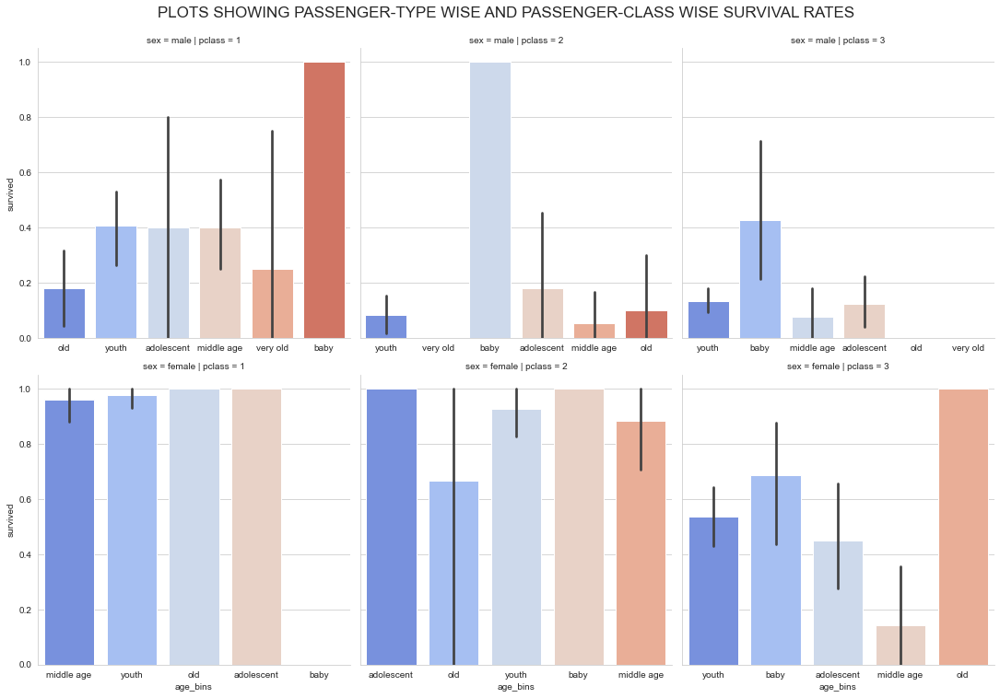

In [49]:
#####
sns.catplot(x= "age_bins", y= "survived", data= titanic, palette= "coolwarm", kind= "bar", col= "pclass", row= "sex", sharex= False)
plt.suptitle("plots showing passenger-type wise and passenger-class wise survival rates".upper(), fontsize= 17, y= 1.03)
plt.show()

<b>Observations: </b>

> <b>Males:</B>
        
        -- Baby had highest rate of survival in all 3 classes with 100% survival rates in pclass1, pclass2 and 42% survival rate in pclass 3.
        
        -- Youth, Middle Aged and Adolescents have relatively healthier survival rate of 40% in pclass 1.
        
        -- All survival rates decliend with increase in pclass 1.
        
        -- "Very Old" people had relatively more chances of survival ONLY in pclass 1
        
> <b>Females:</B>
        
        -- Females have had higher rate of survival then males in all age groups.
        
        -- Adolescents had 100% survival rate in pclass1 and pclass2
        
        -- Youth and middle aged women in pclass1 had 98% survival rate that drastically fell in pclass2 and 3

## Study of Survival Based on Boarding Point

In [50]:
embarkations= titanic["embark_town"].unique()
pclass_list= titanic["pclass"].unique()
pass_type= titanic["who"].unique()

print("*"* 125)
print()
print("SHIP BOARDING STATISTICS".center(125, " "))
print()
for town in embarkations:
    print("_"* 125)
    print()
    print(f"Boarding Statistics at {town}".upper().center(125, " "))
    print("_"* 125)
    
    print("Total", len(titanic[titanic["embark_town"]== town]), "passengers")
    
    for passenger in pass_type:
        temp_list=[]
        print()
        
        for society in sorted(pclass_list):
            print(f"Boarding From: {town.title()} || Passenger Type: {passenger.title()} || Passenger Class: {society} || Number of passengers:", 
                 len(titanic[(titanic["embark_town"]== town) & (titanic["who"]== passenger) & (titanic["pclass"]== society)]))
            
            temp_list.append(len(titanic[(titanic["embark_town"]== town) & (titanic["who"]== passenger) & (titanic["pclass"]== society)]))
        
        print(f"Total {passenger.title()} boarded from {town}:", sum(temp_list))
    print()
    
print("*"* 125)

*****************************************************************************************************************************

                                                   SHIP BOARDING STATISTICS                                                  

_____________________________________________________________________________________________________________________________

                                              BOARDING STATISTICS AT SOUTHAMPTON                                             
_____________________________________________________________________________________________________________________________
Total 646 passengers

Boarding From: Southampton || Passenger Type: Man || Passenger Class: 1 || Number of passengers: 76
Boarding From: Southampton || Passenger Type: Man || Passenger Class: 2 || Number of passengers: 89
Boarding From: Southampton || Passenger Type: Man || Passenger Class: 3 || Number of passengers: 245
Total Man boarded from Southampton: 410

Boa

### Boarding Point Based Survival Rate

### Boarding Statistics

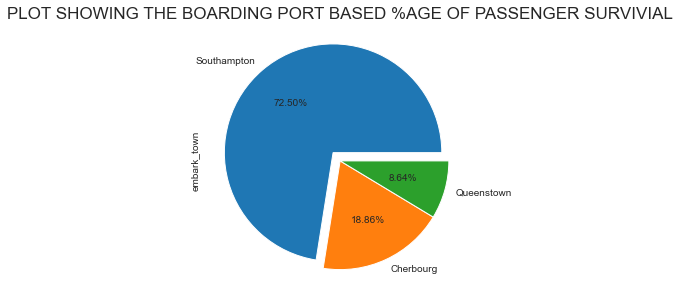

In [51]:
titanic["embark_town"].value_counts().plot.pie(autopct= "%1.2f%%", figsize= (5,5), explode= [0.1, 0, 0])
plt.title("Plot Showing the boarding port based %age of passenger survivial".upper(), fontsize= 17)
plt.show()

<b> Observations: </b>

> Over 72% people embarked from Southampton.

### Overall emabrakation based survival

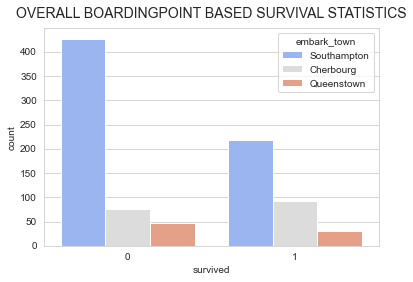

In [52]:
#Overall boarding-point survival statistics

plt.title("overall boardingpoint based survival statistics".upper(), fontsize= 14, y= 1.02)
sns.countplot(x= "survived", data= titanic, hue= "embark_town", palette= "coolwarm")
plt.show()

### Boarding Point Based Study of Survival Rate With Pclass and Passenger Type

C:\Users\shivmohan\anaconda3\lib\site-packages\seaborn\categorical.py:3793: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


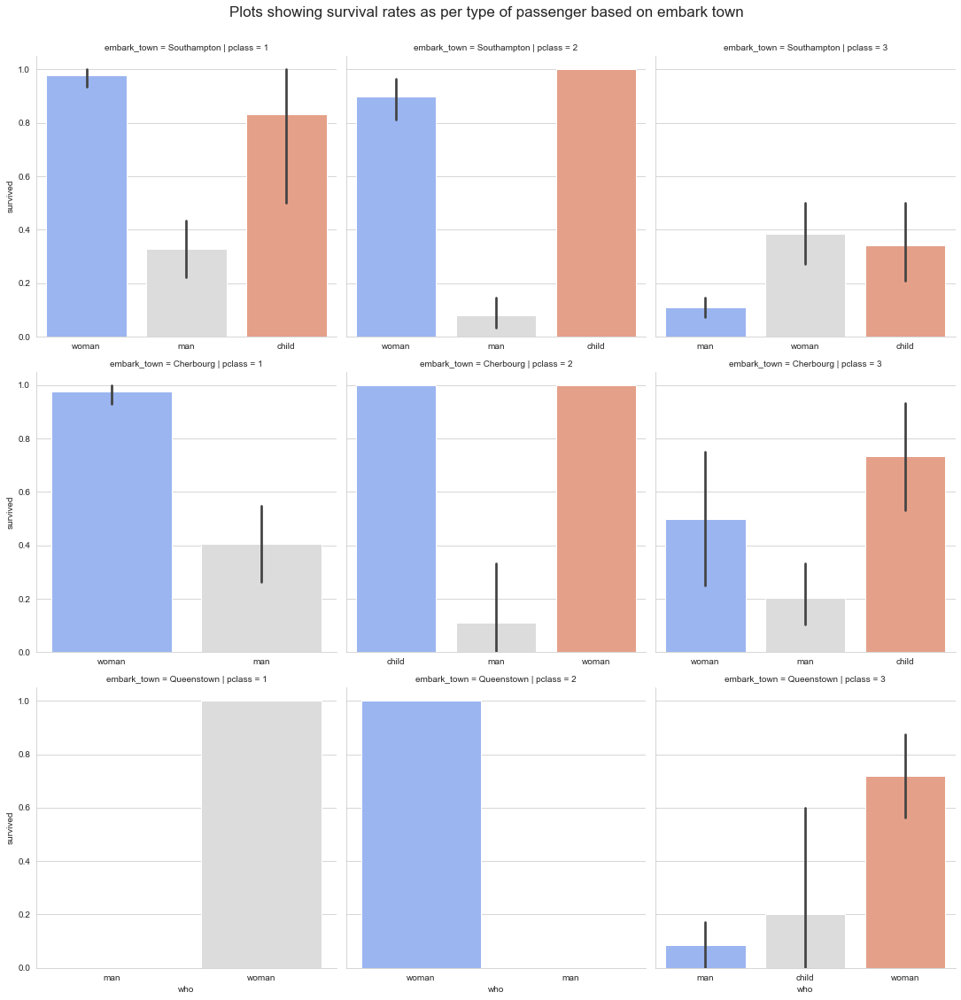

In [53]:
#####
sns.catplot(x= "who", y= "survived", data= titanic, kind= "bar", palette= "coolwarm", col= "pclass", row= "embark_town", sharex= False)
plt.suptitle("Plots showing survival rates as per type of passenger based on embark town", y=1.03, fontsize= 17)
plt.show()

<b> AGEWISE PASSENGER SURVIVAL STATISTICS: </b>

> <b>Southampton:</b>

        -- Pclass1: 98% survival for women and 81% survival rate for children
        
        -- Pclass2: 90% survival rate of women and 100% survival rate for children
        
        -- Pclass3: Maximum survival rate for pclass 3 was for women at only 39%.
        

> <b>Cherbourg:</b>

        -- Pclass1: Relatively higher survival rate for Men (At 40%) - Highest for men in any class boarded from any port. 99% survival rate for women.
        
        -- Pclass2: Women nd children had 100% survival rate.
        
        -- Pclass3: Children had maximum survival rate at 75%.
        

> <b>Queenstown:</b>

        -- Pclass1: 100% survival rate for women.
        
        -- Pclass2: 100% survival rate for women.
        
        -- Pclass3: Survival rate highest for women at 65%.

## Fare Based Survival Study

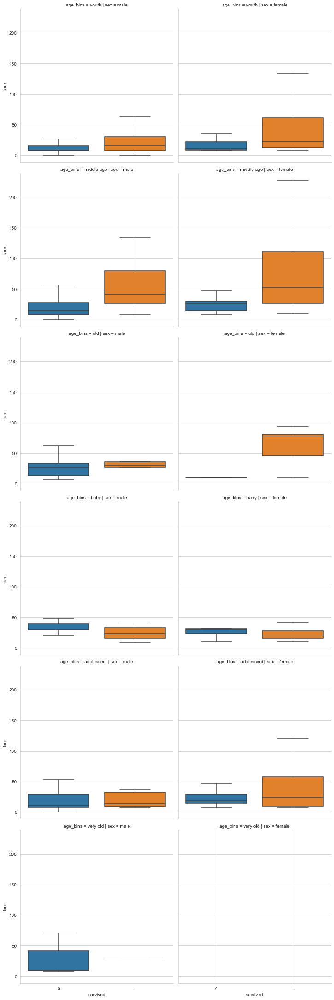

In [54]:
sns.catplot(x= "survived", y= "fare", data= titanic, showfliers= False, kind= "box", col= "sex", row= "age_bins")
plt.show()

<b> Observations: </b>

> Survival rates in most of the age brackets were higher where average fare was higher (People who spent more were more likely to survive) except old, very old and babies.

> Females who survived had spent more amount on fares then their male counterparts.

<b> SUMMARY </B>

> <b>General Rules of Survival: </b>
        
        - The more you pay, the more are the survival chances
        
        - Women had best overall survival rates
        
        - Men had least survival rates
        
        - Higher the customer PClass, the better are the chances of survival.
        
        - Survival probability decreases with increase in age
        
        - People who travelled with someone haad better chances of survival as compared to to the people travelling alone.
        
        - People travelling with Spouce &/ or siblings were more likely to survive if travelling with 1 more co-passenger. Chances fo survival were 53%. The survival rate decreased with increase in group size.
        
        - People travelling with parents &/ or children were more likely to survive @ 60% probability rate is travelling in a group of 3. Seemingly no further correlation with such group sizes were observed.
        
        - Best chances of survival for solo traveler was to be in PClass1 where survival rate is 50%. PClass3 would be the worst class for them to stay.
        
        - Female solo travellers had much better chances of survival then male solo travellers.
        
        
        
> <b> SURVIVAL RATES: </b>

<b>Age: </b>
            
            -- 100% guaranteed survival for:
            
                    -- Pclass1: Males less then 6 years of age
                                Females 6 to 19 years of age
                                Females 50 to 65 years of age
                                
                    -- Pclass2: Males less then 6 years of age
                                Females 6 to 19 years of age
                                Females less then 6 years of age
                                
                    -- Pclass3: Females 50 to 65 years of age
                    
             -- 90% to 100% survival rates:
             
                     -- PClass1: Females between 6 to 19 years of age
                                 Females between 35 to 50 years of age
                                 
                     -- PClass2: Females between 6 to 19 years of age
                     
             -- 80% to 90% survival rates:
                     
                     -- PClass2: Females between 35 to 50 years of age
                     
             -- 70% to 80% survival rates:
             
                     -- NONE
                     
             -- 60% to 70% survival rates:
                     
                     -- PClass2: Females between 50 to 65 years of age
                     
                     -- PClass3: Females below 6 years of age
                     
             -- 10% to 20% survival rates:
                        
                     -- PClass1: Males between 50 to 65 years of age
                     
                     -- PClass2: Males between 6 to 19 years of age
                     
                     -- PClass3: Males between 19 to 35 years of age
                                 Males between 6 to 19 years of age
                                 Females between 35 to 50 years of age
                                 
              -- Less then 10% survival rate:
              
                     -- PClass2: Males between 19 to 35 years of age
                                 Males between 35 to 50 years of age
                                 Males between 50 to 65 years of age
                                 
                     -- PClass3: Males between 35 to 50 years of age
              
              
<b>Boarding Point:</b>
        
              -- 100% guaranteed survival:
              
                      -- Southampton: Child in PClass2
                      
                      -- Cherbourg: Children and Women in PClass2
                                    
                      -- Queenstown: Women in PClass1 and PClass2
                      
              -- 90% to 100% survival rates:
              
                      -- Southampton: Women in PClass2
                      
              -- 80% to 90% survival rates:
                      
                      -- Southampton: Children and Women in PClass1
                                      Women in PClass2
                                      
                      -- Cherbourg: Women in PClass1
                      
              -- 70% to 80% survival rates:
                      
                      -- Cherbourg: Children in PClass3
                      
                      -- Queenstown: Women in PClass3
                      
              -- 10% to 20% survival rates:
                      
                      -- Southampton: Men in PClass3
                      
                      -- Cherbourg: Men in PClass2 and PClass3
                      
                      -- Queenstown: Children in PClass3
                      
              -- Less then 10% survival rate:
              
                      -- Southampton: Men in PClass2
                      
                      -- Queenstown: Men in PClass3     